# Задача 5.1

Пусть 𝜉 = ($𝜉_{1},𝜉_{2})$ ∼ 𝑁(𝑎,Σ), где Σ = $\begin{pmatrix} 10 & 8 \\ 8 & 10 \end{pmatrix}$ . Постройте график плотности этого
случайного вектора. Для 𝑦 ∈ {−3,0,1,5} постройте графики $𝑓_{𝜉_{1}|𝜉_{2}}(𝑥|𝑦). Построить график E(𝜉_{1}|𝜉_{2}
= 𝑦)$ в зависимости от 𝑦 и проведите на этом графике прямую 𝑥 = $E𝜉_{1}$

In [2]:
import numpy as np
import scipy
import pandas as pd
import math
import random
import scipy.stats
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

/Users/semenfedotov/anaconda/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [3]:
a1 = 0
a2 = 0
a = [a1, a2]
sigma = [[10, 8],[8, 10]]

In [4]:
dots = np.linspace(-30, 30, 1000)

In [5]:
#pdf_values = scipy.stats.multivariate_normal.pdf([], mean=a, cov=sigma)

In [6]:
X = np.arange(-10, 10, 0.03)
Y = np.arange(-10, 10, 0.03)
X, Y = np.meshgrid(X, Y)

In [7]:
%%time
az = []
for i in xrange(len(X)) :
    az.append([scipy.stats.multivariate_normal.pdf([X[i][j], Y[i][j]], mean=a, cov=sigma) for j in xrange(len(Y))])

CPU times: user 49.5 s, sys: 323 ms, total: 49.8 s
Wall time: 55.5 s


In [8]:
az

[[0.00010254671663260129,
  0.00010425711767810247,
  0.00010596955120930102,
  0.00010768318746938505,
  0.00010939718226972893,
  0.00011111067760737162,
  0.00011282280230980176,
  0.00011453267270651286,
  0.00011623939332672961,
  0.00011794205762265391,
  0.00011963974871752873,
  0.00012133154017775391,
  0.00012301649680824465,
  0.00012469367547016254,
  0.00012636212592010118,
  0.00012802089166976101,
  0.00012966901086508773,
  0.00013130551718381318,
  0.00013292944075028417,
  0.00013453980906641912,
  0.00013613564795759365,
  0.00013771598253221092,
  0.00013927983815367639,
  0.00014082624142345578,
  0.00014235422117386351,
  0.00014386280946919607,
  0.00014535104261378967,
  0.0001468179621655623,
  0.00014826261595356479,
  0.00014968405909805495,
  0.00015108135503157644,
  0.00015245357651951901,
  0.00015379980667861262,
  0.00015511913999180662,
  0.00015641068331796634,
  0.00015767355689482766,
  0.00015890689533363568,
  0.0001601098486039009,
  0.0001612815

In [9]:
az = np.asarray(az)

In [10]:
from mpl_toolkits.mplot3d import Axes3D

NameError: name 'color_generator' is not defined

/Users/semenfedotov/anaconda/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


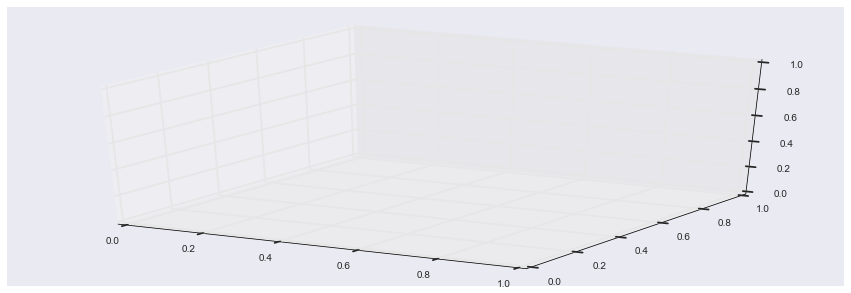

In [11]:
fig = plt.figure(figsize=(15,5))

ax = fig.gca(projection='3d') # get current axis

# Создаем массивы NumPy с координатами точек по осям X и У. 
# Используем метод meshgrid, при котором по векторам координат 
# создается матрица координат. Задаем нужную функцию Z(x, y).
X = np.arange(-10, 10, 0.03)
Y = np.arange(-10, 10, 0.03)
X, Y = np.meshgrid(X, Y)
Z = az

# Наконец, используем метод *plot_surface* объекта 
# типа Axes3DSubplot. Также подписываем оси.
surf = ax.plot_surface(X, Y, Z, color = color_generator())
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Pdf-value')
plt.show()

In [ ]:
plt.subplot(1, 1, 1)
plt.pcolormesh(X, Y, Z,  cmap='RdBu')
plt.colorbar()
plt.show()

$f_{X \mid Y}(x \mid y_0) = \frac{f_{X,Y}(x,y_0)}{f_Y(y_0)}$ so we can do this


In [ ]:
symbols = ['0','1','2','3','4','5','6','7','8','9','a','b','c','d','e','f']
def color_generator() :
    col = '#'
    for i in range(6) :
        col += (symbols[random.randint(0, 15)])
    return col

In [ ]:
def conditional_pdf(X, mean, cov) :
    return scipy.stats.multivariate_normal.pdf([X[0], X[1]], mean, cov) / scipy.stats.norm.pdf(X[1], mean[1], np.sqrt(cov[1][1]))

In [ ]:
ys = [-3,0,1,5]
dots = np.arange(-10, 10, 0.01)
for i in range(len(ys)) :
    plt.figure(figsize=(15,5))
    plt.plot(dots, [conditional_pdf([x, ys[i]], mean=a, cov=sigma) for x in dots], color = color_generator(), label = '$y_{0} = ' + str(ys[i]) + "$")
    plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=2, mode="expand", borderaxespad=0.)
    plt.show()


In [ ]:
ys = [-3,0,1,5]
dots = np.arange(-10, 10, 0.01)
plt.figure(figsize=(15,5))
for i in range(len(ys)) :
    plt.plot(dots, [conditional_pdf([x, ys[i]], mean=a, cov=sigma) for x in dots], color = color_generator(), label = '$y_{0} = ' + str(ys[i]) + "$")
plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=2, mode="expand", borderaxespad=0.)
plt.show()



Осталось нарисовать график условного матожидания $E(\xi_{1} | \xi_{2} = y)$ = $\int_{-\infty}^{+\infty}$ 

Знаем, что плотность многомерного нормального распределения равна $p_{\xi_{1}, \xi_{2}}(x,y) = \frac{1}{2\pi \cdot \sqrt{\det \Sigma}} \cdot e^{- \frac{1}{2}<\Sigma(x - a), (x - a)>} $

Посчитаем интеграл
$\int_{-\infty}^{+\infty} x \cdot p_{\xi_{1}, \xi_{2}}(x,y) dx $

In [13]:
def expectaiton(y, means = a) :
    return np.exp((-121. / 900.) * (y - a[1]) ** 2 + (1. / 20.) * (y - a[1]) ** 2) / (4 * np.sqrt(5 * np.pi))

In [14]:
dotki = np.linspace(-10, 10, 1000)
resalti = [(4. * a[0] - 5. * a[1] + 5. * eta) / 4. for eta in dotki]

In [22]:
import scipy.integrate
resa = scipy.integrate.quad(lambda y : expectaiton(y), -400, 400)

In [23]:
resa

(0.3847418820319328, 2.8546216864575594e-10)

In [15]:
sumka = np.sum([expectaiton(dota) for dota in np.arange(-10,10, 0.01)])

In [16]:
sumka

38.472663321223891

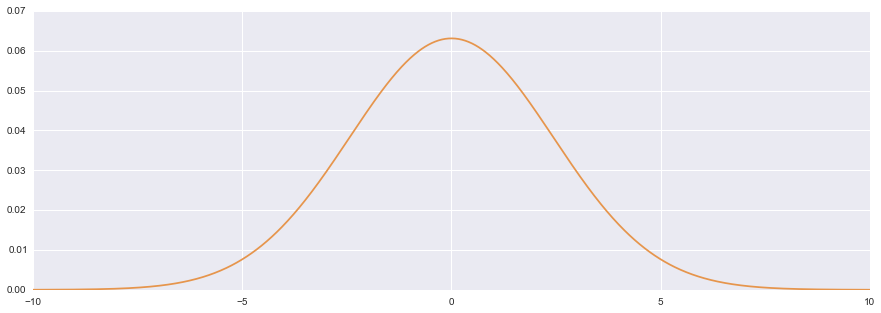

In [141]:
plt.figure(figsize=(15,5))
reski = [expectaiton(dot) for dot in dotki]
plt.plot(dotki, reski, color = color_generator())
